# Instalando OD model

In [ ]:
%%capture
!git clone https://github.com/tensorflow/models.git
!apt-get install protobuf-compiler
!cd models/research && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install . 
!pip install tensorflow --upgrade
!pip uninstall protobuf -y
!pip install protobuf==3.20.3

# Orquestador de detección de objetos

In [ ]:
from config import *

In [ ]:
!mkdir {CUSTOM_MODEL_NAME}

## Creando LabelMap

In [ ]:
!python json2pbtxt.py \
--json_file={JSON_LABEL_MAP_NAME}\
--pbtxt_file={LABEL_MAP_NAME}

Input parameters are:
label_map.json vehicle_detection/label_map.pbtxt
Done


## Creando TF records

In [ ]:
%%capture
!unzip dataset.zip
!rm dataset.zip

In [ ]:
!python csv_to_tf_record.py \
--csv_file={TRAIN_IMAGES_DATASET_FILE}\
--images_dir={TRAIN_IMAGES_FOLDER}\
--output_file={TRAIN_RECORD_FILE}

         filename  ...  class_id
0  fc15988c9a.jpg  ...         2
1  0c535fcdfa.jpg  ...         2
2  0c535fcdfa.jpg  ...         2
3  0c535fcdfa.jpg  ...         2
4  2b37a718bc.jpg  ...         1

[5 rows x 9 columns]
Starting :)
Successfully created the TFRecord file at: vehicle_detection/train.record


In [ ]:
!python csv_to_tf_record.py \
--csv_file={TEST_IMAGES_DATASET_FILE}\
--images_dir={TEST_IMAGES_FOLDER}\
--output_file={TEST_RECORD_FILE}

         filename  ...  class_id
0  2fdd9eb661.jpg  ...         2
1  6f65ac7a0a.jpg  ...         2
2  07ffa35d1f.jpg  ...         1
3  07ffa35d1f.jpg  ...         2
4  07ffa35d1f.jpg  ...         2

[5 rows x 9 columns]
Starting :)
Successfully created the TFRecord file at: vehicle_detection/test.record


## Descargando modelo pre-entrenado

In [ ]:
%%capture
!wget {PRETRAINED_MODEL_URL}
!tar -zxvf {PRETRAINED_MODEL_NAME+'.tar.gz'}
!rm {PRETRAINED_MODEL_NAME+'.tar.gz'}

## Actualizando pipeline.config

In [ ]:
!cp {PRETRAINED_MODEL_NAME+'/pipeline.config'} {CUSTOM_MODEL_NAME+'/pipeline.config'}

In [ ]:
command = "python update_config_file.py --input_config={} --n_classes={} --bs={} --checkpoint={} --ptype={} --label_map={} --train_record={} --test_record={}".format(
    PIPELINE_CONFIG, N_CLASSES, BATCHSIZE, CHECKPOINT, PTYPE, LABEL_MAP_NAME, TRAIN_RECORD_FILE, TEST_RECORD_FILE)
command

'python update_config_file.py --input_config=vehicle_detection/pipeline.config --n_classes=2 --bs=4 --checkpoint=ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0 --ptype=detection --label_map=vehicle_detection/label_map.pbtxt --train_record=vehicle_detection/train.record --test_record=vehicle_detection/test.record'

In [ ]:
!{command}

2023-05-17 01:47:01.540834: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-17 01:47:02.814468: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
start
done


## Entrenamiento

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--pipeline_config_path={PIPELINE_CONFIG} \
--model_dir={CUSTOM_MODEL_NAME} \
--num_train_steps={NUM_STEPS}

2023-05-17 01:48:47.845832: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-17 01:48:49.116851: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
W0517 01:48:54.975490 140490708633408 cross_dev

## TensorBoard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {CUSTOM_MODEL_NAME}

<IPython.core.display.Javascript object>

## Exportando modelo

In [ ]:
%%capture
!python /content/models/research/object_detection/exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path {PIPELINE_CONFIG} \
--trained_checkpoint_dir {CUSTOM_MODEL_NAME} \
--output_directory {OUTPUT_DIRECTORY}

In [ ]:
!cp {LABEL_MAP_NAME} {OUTPUT_DIRECTORY+'/label_map.pbtxt'}

In [ ]:
%%capture
!zip -r fine_tuned_model.zip {OUTPUT_DIRECTORY}

In [ ]:
from google.colab import files
files.download('fine_tuned_model.zip')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Haciendo Inferencia 1 imagen - CÓDIGO VERSION COLAB

In [ ]:
%%capture
!unzip fine_tuned_model.zip

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
import tensorflow as tf
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from cv2 import cvtColor, COLOR_BGR2RGB

In [ ]:
OUTPUT_DIRECTORY = ""


In [ ]:
def classify(image_path):
  # La convertimos a array
  image_np = np.array(Image.open(image_path))

  # La convertimos a tensor y la agregamos una dimensión para que pueda leerla nuestro modelo
  input_tensor = tf.convert_to_tensor(image_np)
  input_tensor = input_tensor[tf.newaxis, ...]

  ## Revisar que la ruta sea la misma de la carpeta.
  PATH_TO_MODEL_DIR = f"/content/{OUTPUT_DIRECTORY}"
  PATH_TO_SAVE_MODEL = PATH_TO_MODEL_DIR + "/saved_model"

  detect_fn = tf.saved_model.load(PATH_TO_SAVE_MODEL)
  # Cargamos el label map para utilizarlo.
  label_map_pbtxt_fname = f"/content/{OUTPUT_DIRECTORY}/label_map.pbtxt"
  category_index = label_map_util.create_category_index_from_labelmap(label_map_pbtxt_fname)


  # Realizamos la detección del objeto
  detections = detect_fn(input_tensor)

  # Analizamos cuántas detecciones se obtuvieron
  num_detections = int(detections.pop('num_detections'))
  detections = {key: value[0,:num_detections].numpy() for key, value in detections.items()}

  detections['num_detections'] = num_detections

  detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

  # Tomamos una imagen y la copiamos para dibujar los bounding box
  image_np_with_detections = image_np.copy()

  # Utilizamos la libreria de obejct detection para visualizar le bounding box y la clasificación
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      max_boxes_to_draw=200,
      min_score_thresh=0.30,
      use_normalized_coordinates = True
  )

  return image_np_with_detections

In [ ]:
# Importamos la imagen
image_path = "coche.jpg"
image_np_with_detections = classify(image_path)

# Visualizamos resultados


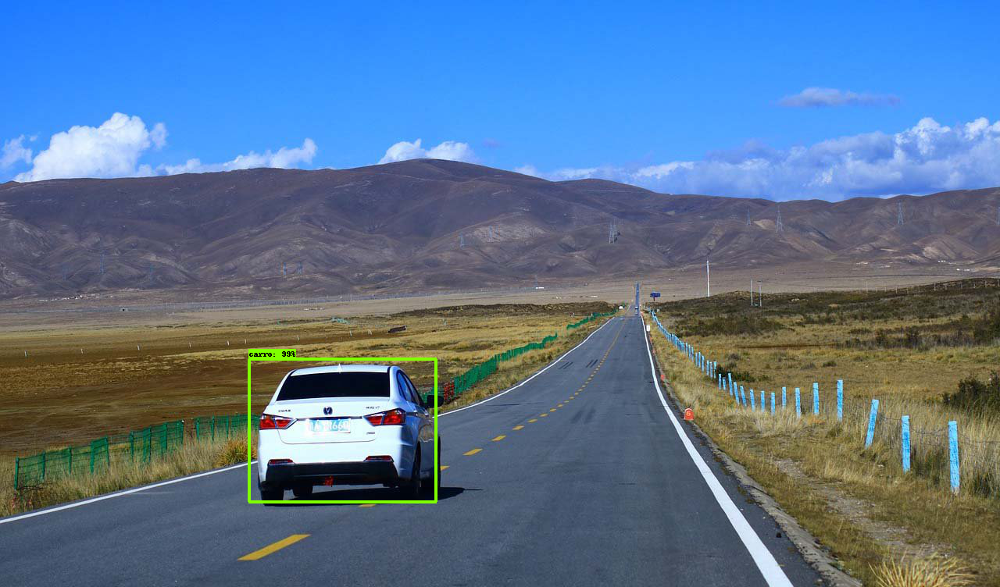

In [ ]:
cv2_imshow(cvtColor(image_np_with_detections, COLOR_BGR2RGB))


# Inferencia en video - Tracking system

In [ ]:
%%capture
!unzip fine_tuned_model.zip

In [ ]:
import numpy as np
import imutils
import time
import dlib
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from imutils.video import VideoStream
from imutils.video import FPS
from centroidtracker import CentroidTracker
from trackableobject import TrackableObject
import tensorflow as tf

In [ ]:
PATH_TO_SAVE_MODEL = "/content/fine_tuned_model/saved_model"

detect_fn = tf.saved_model.load(PATH_TO_SAVE_MODEL)

# Ruta del video (Se debe cargar de manera manual)
PATH_VIDEO = "/content/test_video.mp4"

# Ruta del video en donde almacenaremos los resultados
PATH_OUTPUT = "/content/video_out.mp4"

# Cuántos frames vamos a saltarnos (Durante estos frames nuestro algoritmo de seguimiento funciona)
SKIP_FPS = 30

# Cuál será el umbral mínimo par que se considere una detección
TRESHOLD = 0.5

# Cargamos el video
vs = cv2.VideoCapture(PATH_VIDEO)

# Inicializamos el writer para poder guardar el video
writer = None

# Definimos ancho y alto
W = int(vs.get(cv2.CAP_PROP_FRAME_WIDTH))
H = int(vs.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Inicializamos la clase centroid tracker con dos variable fundamentales
# maxDissapared (Si pasa ese tiempo y no se detecta más el centroide lo elimina)
# Si la distancia es mayor a maxDistance no lo podra asociar como si fuera el mismo objecto.
ct = CentroidTracker(maxDisappeared= 40, maxDistance = 50)

# Inicializamos variables principales
trackers = []
trackableObjects = {}

totalFrame = 0
totalDown = 0
totalUp = 0

DIRECTION_PEOPLE = True

# Creamos un umbral para sabre si el carro paso de izquierda a derecha o viceversa
# En este caso lo deje fijo pero se pudiese configurar según la ubicación de la cámara.
POINT = [0, int((H/2)-H*0.1), W, int(H*0.1)]

# Los FPS nos van a permitir ver el rendimiento de nuestro modelo y si funciona en tiempo real.
fps = FPS().start()

# Definimos el formato del archivo resultante y las rutas.
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
writer = cv2.VideoWriter(PATH_OUTPUT, fourcc, 20.0, (W, H), True)

# Bucle que recorre todo el video
while True:
  # Leemos el primer frame
  ret, frame = vs.read()

  # Si ya no hay más frame, significa que el video termino y por tanto se sale del bucle
  if frame is None:
    break
  
  status = "Waiting"
  rects = []

  # Nos saltamos los frames especificados.
  if totalFrame % SKIP_FPS == 0:
    status = "Detecting"
    trackers = []
    # Tomamos la imagen la convertimos a array luego a tensor
    image_np = np.array(frame)

    input_tensor = tf.convert_to_tensor(image_np)
    input_tensor = input_tensor[tf.newaxis, ...]

    # Predecimos los objectos y clases de la imagen
    detections = detect_fn(input_tensor)

    detection_scores = np.array(detections["detection_scores"][0])
    # Realizamos una limpieza para solo obtener las clasificaciones mayores al umbral.
    detection_clean = [x for x in detection_scores if x >= TRESHOLD]

    # Recorremos las detecciones
    for x in range(len(detection_clean)):
      idx = int(detections['detection_classes'][0][x])
      # Tomamos los bounding box 
      ymin, xmin, ymax, xmax = np.array(detections['detection_boxes'][0][x])
      box = [xmin, ymin, xmax, ymax] * np.array([W,H, W, H])

      (startX, startY, endX, endY) = box.astype("int")

      # Con la función de dlib empezamos a hacer seguimiento de los boudiung box obtenidos
      tracker = dlib.correlation_tracker()
      rect = dlib.rectangle(startX, startY, endX, endY)
      tracker.start_track(frame, rect)

      trackers.append(tracker)
  else:
    # En caso de que no hagamos detección haremos seguimiento
    # Recorremos los objetos que se les está realizando seguimiento
    for tracker in trackers:
      status = "Tracking"
      # Actualizamos y buscamos los nuevos bounding box
      tracker.update(frame)
      pos = tracker.get_position()

      startX = int(pos.left())
      startY = int(pos.top())
      endX = int(pos.right())
      endY = int(pos.bottom())

      rects.append((startX, startY, endX, endY))

  # Dibujamos el umbral de conteo
  cv2.rectangle(frame, (POINT[0], POINT[1]), (POINT[0]+ POINT[2], POINT[1] + POINT[3]), (255, 0, 255), 2)

  objects = ct.update(rects)

  # Recorremos cada una de las detecciones
  for (objectID, centroid) in objects.items():
    # Revisamos si el objeto ya se ha contado
    to = trackableObjects.get(objectID, None)
    if to is None:
      to = TrackableObject(objectID, centroid)

    else:
      # Si no se ha contado, analizamos la dirección del objeto
      y = [c[1] for c in to.centroids]
      direction = centroid[1] - np.mean(y)
      to.centroids.append(centroid)
      if not to.counted:
        if centroid[0] > POINT[0] and centroid[0] < (POINT[0]+ POINT[2]) and centroid[1] > POINT[1] and centroid[1] < (POINT[1]+POINT[3]):
          if DIRECTION_PEOPLE:
            if direction >0:
              totalUp += 1
              to.counted = True
            else:
              totalDown +=1
              to.counted = True
          else:
            if direction <0:
              totalUp += 1
              to.counted = True
            else:
              totalDown +=1
              to.counted = True

    trackableObjects[objectID] = to

    # Dibujamos el centroide y el ID de la detección encontrada
    text = "ID {}".format(objectID)
    cv2.putText(frame, text, (centroid[0]-10, centroid[1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,255,0), 2)
    cv2.circle(frame, (centroid[0], centroid[1]), 4, (0,255,0), -1)
  
  # Totalizamos los resultados finales
  info = [
          ("Subiendo", totalUp),
          ("Bajando", totalDown),
          ("Estado", status),
  ]

  for (i, (k,v)) in enumerate(info):
    text = "{}: {}".format(k,v)
    cv2.putText(frame, text, (10, H - ((i*20) + 20)), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,255), 2)

  # Almacenamos el framme en nuestro video resultante.
  writer.write(frame)
  totalFrame += 1
  fps.update()

# Terminamos de analizar FPS y mostramos resultados finales
fps.stop()

print("Tiempo completo {}".format(fps.elapsed()))
print("Tiempo aproximado por frame {}".format(fps.fps()))

# Cerramos el stream the almacenar video y de consumir el video.
writer.release()
vs.release()


Tiempo completo 92.113521
Tiempo aproximado por frame 19.204563898930754
